### EDA IOWA Dataset - Exploratory Data Analysis (1)

**Status:** PUBLIC Distribution <br>

**Author:** Jaume Manero IE<br>
**Date created:** 2021/02/1<br>
**Last modified:** 2025/01/08<br>
**Description:** Analysis of IOWA Dataset

This dataset contains every wholesale purchase of liquor in the State of Iowa by retailers for sale to individuals since January 1, 2012 til 2023
The State of Iowa controls the wholesale distribution of liquor intended for retail sale, which means this dataset offers a complete view of retail liquor sales in the entire state. The dataset contains every wholesale order of liquor by all grocery stores, liquor stores, convenience stores, etc., with details about the store and location, the exact liquor brand and size, and the number of bottles ordered.

The installation of Geopandas and Plotly for the cholorpeth image is quite obscure and has dependencies with versions and operating system. Try to follow the error explanations to install all dependent packages.

In [1]:
# Liquor Sales : 
#    file: https://mydata.iowa.gov/Sales-Distribution/Iowa-Liquor-Sales/m3tr-qhgy
# US County Boundaries & FIP Codes
#    file: https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_county_20m.zip
# Counties Population
#    file: https://data.iowa.gov/Community-Demographics/County-Population-in-Iowa-by-Year/qtnr-zsrc
# Cities in IOWA population
#    file: https://data.iowa.gov/Community-Demographics/Total-City-Population-by-Year/acem-thbp

In [2]:
import pandas as pd
from thefuzz import fuzz
import folium
import warnings
import geopandas
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly
import plotly.figure_factory as ff
import plotly.graph_objects as go
%matplotlib inline
warnings.filterwarnings('ignore')

In [3]:
file = './data/Iowa_Liquor_Sales_DEC24.csv'
df = pd.read_csv(file, header=0)

In [4]:
df.tail(10)

,Invoice/Item Number,Date,Store Number,Store Name,Address,City,Zip Code,Store Location,County Number,County,...,Item Number,Item Description,Pack,Bottle Volume (ml),State Bottle Cost,State Bottle Retail,Bottles Sold,Sale (Dollars),Volume Sold (Liters),Volume Sold (Gallons)
30767337,INV-10070800004,01/29/2018,2591,HY-VEE WINE AND SPIRITS / ATLANTIC,1602 E 7TH ST,ATLANTIC,50022.0,POINT (-94.990031 41.403856),15.0,CASS,...,8828,LAUDER'S,6,1750,10.85,16.28,6,100.62,10.50,2.77
30767338,INV-10038700003,01/26/2018,2673,HY-VEE # 6/ DES MOINES,420 COURT AVE,DES MOINES,50309.0,POINT (-93.62245400000002 41.584842),77.0,POLK,...,35318,BARTON VODKA,6,1750,6.92,10.38,6,62.28,10.50,2.77
30767339,INV-09931400034,01/22/2018,2512,HY-VEE WINE AND SPIRITS / IOWA CITY,1720 WATERFRONT DR,IOWA CITY,52240.0,POINT (-91.53046300000001 41.642764),52.0,JOHNSON,...,76487,PARAMOUNT AMARETTO,12,1000,4.05,6.08,12,72.96,12.00,3.17
30767340,INV-09999000029,01/24/2018,5514,JOHNCY'S LIQUOR STORE,585 HWY 965 STE D & E,NORTH LIBERTY,52317.0,POINT (-91.60761 41.738129),52.0,JOHNSON,...,10626,CANADIAN CLUB WHISKY,12,750,8.00,12.00,12,141.72,9.00,2.38
30767341,INV-09930200009,01/22/2018,5482,IOWA MINI MART,234 W 3RD ST,DAVENPORT,52801.0,POINT (-90.576054 41.522413),82.0,SCOTT,...,37994,SMIRNOFF 80PRF,24,375,4.75,7.13,6,42.78,2.25,0.59
30767342,INV-09933800009,01/22/2018,5077,WAL-MART 3150 / COUNCIL BLUFFS,1800 N 16TH ST,COUNCIL BLUFFS,51501.0,POINT (-95.867459 41.27737),78.0,POTTAWATTAMIE,...,17958,EVAN WILLIAMS YR STR BOURBON,6,1750,15.50,23.25,6,139.50,10.50,2.77
30767343,INV-09995400025,01/24/2018,3723,J D SPIRITS LIQUOR,1023 9TH ST,ONAWA,51040.0,POINT (-96.095845 42.025841),67.0,MONONA,...,86670,JACK DANIEL'S TENNESSEE HONEY,12,750,15.57,23.36,1,23.36,0.75,0.20
30767344,INV-09915800017,01/22/2018,2648,HY-VEE #4 / WDM,555 S 51ST ST,WEST DES MOINES,50265.0,POINT (-93.773557 41.561197),77.0,POLK,...,65126,GRAND MARNIER CORDON ROUGE,12,750,23.31,34.97,3,104.91,2.25,0.59
30767345,INV-09968400005,01/23/2018,4485,DYNO'S 51 / SANBORN,101 W 7TH ST,SANBORN,51248.0,POINT (-95.656064 43.186035000000004),71.0,O'BRIEN,...,11774,BLACK VELVET,24,375,3.07,4.61,4,18.44,1.50,0.40
30767346,INV-09924700003,01/22/2018,3762,WINE AND SPIRITS GALLERY,7690 HICKMAN RD,WINDSOR HEIGHTS,50322.0,NaN,77.0,POLK,...,29287,BARTON GIN,12,1000,3.92,5.88,12,70.56,12.00,3.17


In [5]:
df.dtypes

Invoice/Item Number       object
Date                      object
Store Number               int64
Store Name                object
Address                   object
City                      object
Zip Code                  object
Store Location            object
County Number            float64
County                    object
Category                 float64
Category Name             object
Vendor Number            float64
Vendor Name               object
Item Number               object
Item Description          object
Pack                       int64
Bottle Volume (ml)         int64
State Bottle Cost        float64
State Bottle Retail      float64
Bottles Sold               int64
Sale (Dollars)           float64
Volume Sold (Liters)     float64
Volume Sold (Gallons)    float64
dtype: object

In [6]:
df.columns

Index(['Invoice/Item Number', 'Date', 'Store Number', 'Store Name', 'Address',
       'City', 'Zip Code', 'Store Location', 'County Number', 'County',
       'Category', 'Category Name', 'Vendor Number', 'Vendor Name',
       'Item Number', 'Item Description', 'Pack', 'Bottle Volume (ml)',
       'State Bottle Cost', 'State Bottle Retail', 'Bottles Sold',
       'Sale (Dollars)', 'Volume Sold (Liters)', 'Volume Sold (Gallons)'],
      dtype='object')

In [7]:
df[['dummy','Lat', 'Lon']]= df['Store Location'].str.split(" ", n=-1, expand=True)

In [8]:
df['Lat'] = df['Lat'].str.replace('(', '')
df['Lon'] = df['Lon'].str.replace(')', '')

In [9]:
a = df['Store Location'].unique()
print( 'There are', len(a), 'stores')

There are 11131 stores


In [10]:
# What is the start and the end of the dataframe?
df['Date'] = pd.to_datetime(df['Date'])

# Find start and end dates
start_date = df['Date'].min()
end_date = df['Date'].max()

print(f"Start Date: {start_date}")
print(f"End Date: {end_date}")


Start Date: 2012-01-03 00:00:00
End Date: 2024-12-31 00:00:00


In [11]:
# to make the problem easier for the laptops we perform the exploration in 2024
df = df[df['Date'].dt.year == 2024]
df['County Number']


12037775   NaN
12037777   NaN
12037790   NaN
12037791   NaN
12037793   NaN
            ..
16650297   NaN
16650298   NaN
16650299   NaN
16650300   NaN
16650301   NaN
Name: County Number, Length: 2590975, dtype: float64

In [12]:
# For some reason there are not County numbers in 2024
df_mapping = pd.read_excel('./data/Counties_IOWA.xlsx')
df_mapping['County Name'] = df_mapping['County Name'].str.upper()
df['County'] = df['County'].str.upper()

mapping_dict = pd.Series(df_mapping['County Number'].values, index=df_mapping['County Name']).to_dict()

df['County Number'] = df['County'].map(mapping_dict)
df = df.dropna(subset=['County'])
df['County Number'] = df['County Number'].astype(int)
df_back = df.copy()

In [13]:
mapping_dict

{'ADAIR': 1,
 'ADAMS': 2,
 'ALLAMAKEE': 3,
 'APPANOOSE': 4,
 'AUDUBON': 5,
 'BENTON': 6,
 'BLACK HAWK': 7,
 'BOONE': 8,
 'BREMER': 9,
 'BUCHANAN': 10,
 'BUENA VISTA': 11,
 'BUTLER': 12,
 'CALHOUN': 13,
 'CARROLL': 14,
 'CASS': 15,
 'CEDAR': 16,
 'CERRO GORDO': 17,
 'CHEROKEE': 18,
 'CHICKASAW': 19,
 'CLARKE': 20,
 'CLAY': 21,
 'CLAYTON': 22,
 'CLINTON': 23,
 'CRAWFORD': 24,
 'DALLAS': 25,
 'DAVIS': 26,
 'DECATUR': 27,
 'DELAWARE': 28,
 'DES MOINES': 29,
 'DICKINSON': 30,
 'DUBUQUE': 31,
 'EMMET': 32,
 'FAYETTE': 33,
 'FLOYD': 34,
 'FRANKLIN': 35,
 'FREMONT': 36,
 'GREENE': 37,
 'GRUNDY': 38,
 'GUTHRIE': 39,
 'HAMILTON': 40,
 'HANCOCK': 41,
 'HARDIN': 42,
 'HARRISON': 43,
 'HENRY': 44,
 'HOWARD': 45,
 'HUMBOLDT': 46,
 'IDA': 47,
 'IOWA': 48,
 'JACKSON': 49,
 'JASPER': 50,
 'JEFFERSON': 51,
 'JOHNSON': 52,
 'JONES': 53,
 'KEOKUK': 54,
 'KOSSUTH': 55,
 'LEE': 56,
 'LINN': 57,
 'LOUISA': 58,
 'LUCAS': 59,
 'LYON': 60,
 'MADISON': 61,
 'MAHASKA': 62,
 'MARION': 63,
 'MARSHALL': 64,
 'MILLS'

In [14]:
# do we have invoices with multiple lines?
#pd.concat(g for _, g in df.groupby("Invoice/Item Number") if len(g) > 1)
#df[df.duplicated(["Invoice/Item Number"], keep=False)]

In [15]:
# Split invoice and item in two columns
df["invoice_number"] = df["Invoice/Item Number"].str[1:9]
df["item_number"]    = df["Invoice/Item Number"].str[9:12]

In [16]:
df["invoice_number"]

12037775    NV-74819
12037777    NV-74822
12037790    NV-74848
12037793    NV-74857
12037797    NV-74862
              ...   
16650297    NV-78160
16650298    NV-78189
16650299    NV-78188
16650300    NV-78167
16650301    NV-78182
Name: invoice_number, Length: 2590553, dtype: object

In [17]:
df.sort_values(["invoice_number", "item_number"], ascending=[True, True], inplace=True)

In [18]:
df.columns
df_back = df.copy()

####  **Best-selling Category (by liters)**

In [19]:
df["Category Name"] = df["Category Name"].str.upper()
df_rank = df.groupby(['Category Name'])[['Volume Sold (Liters)']].sum().reset_index()
df_rank.sort_values(["Volume Sold (Liters)"], ascending=[False], inplace=True)
categories = df_rank['Category Name'].tolist()


In [20]:
categories

['AMERICAN VODKAS',
 'CANADIAN WHISKIES',
 'STRAIGHT BOURBON WHISKIES',
 'SPICED RUM',
 'WHISKEY LIQUEUR',
 'COCKTAILS/RTD',
 '100% AGAVE TEQUILA',
 'IMPORTED VODKAS',
 'AMERICAN FLAVORED VODKA',
 'BLENDED WHISKIES',
 'MIXTO TEQUILA',
 'TENNESSEE WHISKIES',
 'WHITE RUM',
 'TEMPORARY & SPECIALTY PACKAGES',
 'AMERICAN SCHNAPPS',
 'FLAVORED RUM',
 'IMPORTED CORDIALS & LIQUEURS',
 'AMERICAN BRANDIES',
 'CREAM LIQUEURS',
 'IMPORTED DISTILLED SPIRITS SPECIALTY',
 'IMPORTED SCHNAPPS',
 'IRISH WHISKIES',
 'AMERICAN DRY GINS',
 'IMPORTED BRANDIES',
 'SCOTCH WHISKIES',
 'TRIPLE SEC',
 'IMPORTED FLAVORED VODKA',
 'IMPORTED DRY GINS',
 'AMERICAN CORDIALS & LIQUEURS',
 'SPECIAL ORDER ITEMS',
 'NEUTRAL GRAIN SPIRITS FLAVORED',
 'STRAIGHT RYE WHISKIES',
 'COFFEE LIQUEURS',
 'GOLD RUM',
 'AMERICAN DISTILLED SPIRITS SPECIALTY',
 'SINGLE MALT SCOTCH',
 'BOTTLED IN BOND BOURBON',
 'SINGLE BARREL BOURBON WHISKIES',
 'AGED DARK RUM',
 'FLAVORED GIN',
 'NEUTRAL GRAIN SPIRITS',
 'MEZCAL',
 'CORN WHISKIES',
 


#### **Ranking of vendors**

In [21]:
# Solve uppercase and lowercase
df['Vendor Name'] = df['Vendor Name'].str.upper()

In [22]:
df['Vendor Name'] = df['Vendor Name'].apply(str)
vendors_lst = df['Vendor Name'].unique().tolist()
vendors_lst.sort()

In [23]:
vendors_lst

['10TH MOUNTAIN WHISKEY AND SPIRIT COMPANY',
 '15 STARS, LLC',
 '173 CRAFT DISTILLERY',
 '21ST CENTURY SPIRITS LLC',
 '3 BADGE CORPORATION',
 '45TH PARALLEL SPIRITS',
 "ABSINTHIA'S BOTTLED SPIRITS, LLC",
 'AIKO IMPORTERS INC',
 'ALLTECH BEVERAGE DIVISION LLC',
 'ALTAMAR BRANDS LLC',
 'ALTOS PLANOS INC.',
 'AMERICAN HERITAGE DISTILLERS, LLC / CENTURY FARMS DISTILLERY',
 'AMERICAN PREMIUM VODKA, LLC',
 'AMERICAN SPIRITS EXCHANGE',
 'AMROTH',
 'ATOMIC BRANDS INC',
 'BACARDI USA INC',
 'BAD BEAR ENTERPRISES LLC / LEGENDARY RYE',
 'BALUARTE SPIRITS LLC',
 'BENCHMARK BEVERAGE COMPANY LLC',
 'BEST CASE WINES LLC',
 'BLACK ROCK SPIRITS',
 'BLUE OX SPIRITS, INC.',
 'BONAVITA BEVERAGE GROUP, LLC',
 'BRECKENRIDGE DISTILLERY / DOUBLE DIAMOND DISTILLERY LLC',
 'BROWN FORMAN CORP.',
 'BUZZARDS ROOST SPIRITS LLC',
 'BUZZBALLZ LLC / SOUTHERN CHAMPION',
 'CADRE NOIR LLC / CNI BRANDS',
 'CALEDONIA SPIRITS',
 'CALIFORNIA TEQUILA INC',
 'CAMPARI AMERICA',
 'CARIBBEAN SPIRITS INC',
 'CARRIAGE HOUSE IMPORTS


#### **How to homogeneize a dataframe column eliminating duplicates and synonyms with fuzzy comparison**


In [24]:
# We test several similarity measures. We use a combination of levenstein distance calculation for the cleansing
# see similar function

In [25]:
#see https://github.com/seatgeek/thefuzz
def similar(e1,e2, trace=False):
    k1 = fuzz.ratio(e1,e2)
    k2 = fuzz.partial_ratio(e1,e2)
    k3 = fuzz.token_sort_ratio(e1,e2)
    k4 = fuzz.partial_token_sort_ratio(e1,e2)
    k5 = fuzz.token_set_ratio(e1,e2)
    k = (k1+k2+k3+k4+k5)/5
    if trace:
       print(e1, e2, 'rating',k,'partials:',k1,k2,k3,k4)
    if k >= 80:          # if are similar
       return True
    else:
       return False


In [26]:
similar('LEVECKE CORP','LEVECKE CORPORATION',trace=True)
similar('S&B FARMS DISTILLERY','S&B FARMSTEAD DISTILLERY',trace=True)
similar('DUNKEL CORPORATION','DUNKEL CORPORATION / IOWA DISTILLING',trace=True)
similar('3 BADGE CORPORATION', 'DUNKEL CORPORATION',trace=True)
similar('BOOT HILL DISTILLERY LLC','BULL RUN DISTILLERY LLC',trace=True)
similar('KINDRED SPIRIT N AMERICA', 'KINDRED SPIRITS OF NORTH AMERICA',trace=True)
similar('3 BADGE CORPORATION', '3 BADGE MIXOLOGY',trace=True)
similar('B. T. O. DISTILLERS LLC', 'DISTILLERS WAY, LLC',trace=True)
similar('A HARDY / U.S.A., LTD.', 'A HARDY USA LTD',trace=True)
similar('LUXCO INC', 'LUXCO-CLEVELAND',trace=True)
similar('SAZERAC CO., INC.',  'SAZERAC COMPANY  INC',trace=True)
similar('SAZERAC CO., INC.',  'SAZERAC COMPANY  INC')

LEVECKE CORP LEVECKE CORPORATION rating 82.6 partials: 77 100 77 82
S&B FARMS DISTILLERY S&B FARMSTEAD DISTILLERY rating 89.6 partials: 91 80 91 95
DUNKEL CORPORATION DUNKEL CORPORATION / IOWA DISTILLING rating 84.0 partials: 67 100 69 84
3 BADGE CORPORATION DUNKEL CORPORATION rating 74.4 partials: 76 85 59 76
BOOT HILL DISTILLERY LLC BULL RUN DISTILLERY LLC rating 76.0 partials: 77 85 68 73
KINDRED SPIRIT N AMERICA KINDRED SPIRITS OF NORTH AMERICA rating 83.8 partials: 86 75 86 86
3 BADGE CORPORATION 3 BADGE MIXOLOGY rating 62.6 partials: 57 69 57 69
B. T. O. DISTILLERS LLC DISTILLERS WAY, LLC rating 81.0 partials: 67 85 79 86
A HARDY / U.S.A., LTD. A HARDY USA LTD rating 81.8 partials: 81 73 81 87
LUXCO INC LUXCO-CLEVELAND rating 67.2 partials: 50 75 58 82
SAZERAC CO., INC. SAZERAC COMPANY  INC rating 83.0 partials: 76 74 85 92


True

In [27]:
similar('apple', 'red apple',trace=True)
similar('apple', 'bananas', trace=True)
similar('apple', 'many apples', trace=True)
similar('apple', 'apples rot', trace=True)

apple red apple rating 88.4 partials: 71 100 71 100
apple bananas rating 21.8 partials: 17 29 17 29
apple many apples rating 77.2 partials: 62 100 62 100
apple apples rot rating 80.2 partials: 67 100 67 100


True

In [28]:
    
def homogen(x):
    for e in MEGA_lst:
       if x in e:
          return e[0]
          break
    return x

mega_lst = []
for i in range(0, len(vendors_lst)):
    el = vendors_lst[i]
    hit_list = []
    for element in vendors_lst:

        if (similar(element, el)): 
            hit_list.append(element)
    hit_list.sort() 
    if (len(hit_list)) > 1:
        mega_lst.append(hit_list)

MEGA_lst = [list(tupl) for tupl in {tuple(item) for item in mega_lst}] # trick to eliminate duplicates
MEGA_lst.sort()
df['Vendor Name simple'] = df['Vendor Name'].apply(homogen)  
print('duplicate categories eliminated with Fuzzy and Levenshtein distance - see thefuzz package')

duplicate categories eliminated with Fuzzy and Levenshtein distance - see thefuzz package


In [29]:
MEGA_lst

[['BALUARTE SPIRITS LLC',
  'CHUCKER SPIRITS, LLC',
  'DV SPIRITS LLC',
  'HARMONY SPIRITS LLC',
  'HEAVENLY SPIRITS LLC',
  'LALO SPIRITS LLC',
  'ONE LIFE SPIRITS LLC',
  'OZ SPIRITS LLC',
  'SALOON SPIRITS LLC',
  'TERRANOVA SPIRITS LLC',
  'UNIFIED SPIRITS, LLC'],
 ['BALUARTE SPIRITS LLC',
  'CHUCKER SPIRITS, LLC',
  'DV SPIRITS LLC',
  'HARMONY SPIRITS LLC',
  'HEAVENLY SPIRITS LLC',
  'LALO SPIRITS LLC',
  'OZ SPIRITS LLC',
  'TERRANOVA SPIRITS LLC',
  'UNIFIED SPIRITS, LLC'],
 ['BALUARTE SPIRITS LLC',
  'DV SPIRITS LLC',
  'GLOBAL SPIRITS USA, LLC',
  'HARMONY SPIRITS LLC',
  'HEAVENLY SPIRITS LLC',
  'LALO SPIRITS LLC',
  'OZ SPIRITS LLC',
  'SALOON SPIRITS LLC',
  'UNA FAMILIA SPIRITS LLC',
  'XAMAY GLOBAL SPIRITS LLC'],
 ['BALUARTE SPIRITS LLC',
  'DV SPIRITS LLC',
  'LALO SPIRITS LLC',
  'OZ SPIRITS LLC'],
 ['CEO DISTILLING LLC', 'DRUM CIRCLE DISTILLING, LLC'],
 ['CEO DISTILLING LLC',
  'DRUM CIRCLE DISTILLING, LLC',
  'KNEE-HIGH DISTILLING CO. LLC',
  'RUSH CREEK DISTILLING

In [30]:
v_lst = df['Vendor Name simple'].unique().tolist()
v_lst.sort()
print('before', len(vendors_lst), 'after', len(v_lst))
v_lst

before 239 after 210


['10TH MOUNTAIN WHISKEY AND SPIRIT COMPANY',
 '15 STARS, LLC',
 '173 CRAFT DISTILLERY',
 '21ST CENTURY SPIRITS LLC',
 '3 BADGE CORPORATION',
 '45TH PARALLEL SPIRITS',
 "ABSINTHIA'S BOTTLED SPIRITS, LLC",
 'AIKO IMPORTERS INC',
 'ALLTECH BEVERAGE DIVISION LLC',
 'ALTAMAR BRANDS LLC',
 'ALTOS PLANOS INC.',
 'AMERICAN HERITAGE DISTILLERS, LLC / CENTURY FARMS DISTILLERY',
 'AMERICAN PREMIUM VODKA, LLC',
 'AMERICAN SPIRITS EXCHANGE',
 'AMROTH',
 'ATOMIC BRANDS INC',
 'BACARDI USA INC',
 'BAD BEAR ENTERPRISES LLC / LEGENDARY RYE',
 'BALUARTE SPIRITS LLC',
 'BENCHMARK BEVERAGE COMPANY LLC',
 'BEST CASE WINES LLC',
 'BLACK ROCK SPIRITS',
 'BLUE OX SPIRITS, INC.',
 'BONAVITA BEVERAGE GROUP, LLC',
 'BRECKENRIDGE DISTILLERY / DOUBLE DIAMOND DISTILLERY LLC',
 'BROWN FORMAN CORP.',
 'BUZZARDS ROOST SPIRITS LLC',
 'BUZZBALLZ LLC / SOUTHERN CHAMPION',
 'CADRE NOIR LLC / CNI BRANDS',
 'CALEDONIA SPIRITS',
 'CALIFORNIA TEQUILA INC',
 'CAMPARI AMERICA',
 'CARIBBEAN SPIRITS INC',
 'CARRIAGE HOUSE IMPORTS

#### **Ranking Vendors (liters)**

In [31]:
df_rank = df.groupby(['Vendor Name simple'])[['Volume Sold (Liters)','Sale (Dollars)']].sum().reset_index()
df_rank.sort_values(["Volume Sold (Liters)"], ascending=[False], inplace=True)
brands = df_rank['Vendor Name simple'].tolist()

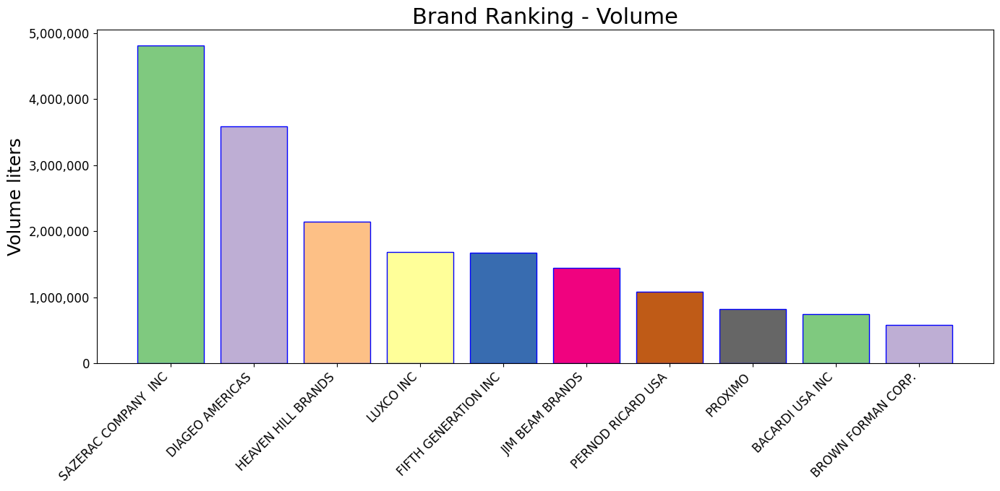

In [32]:

df_rank = df_rank.head(10)
fig, ax = plt.subplots(figsize=(16, 6))
#sns.set(style = 'white')
name = "Accent"
cmap = plt.get_cmap(name)  # type: matplotlib.colors.ListedColormap
colors = cmap.colors  # type: list

plt.title('Brand Ranking - Volume', size=22)
ax.bar(df_rank['Vendor Name simple'], df_rank['Volume Sold (Liters)'], color=colors, edgecolor='blue')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
plt.ylabel('Volume liters', size=18)
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12)
plt.show()

In [33]:
df_rank.columns

Index(['Vendor Name simple', 'Volume Sold (Liters)', 'Sale (Dollars)'], dtype='object')

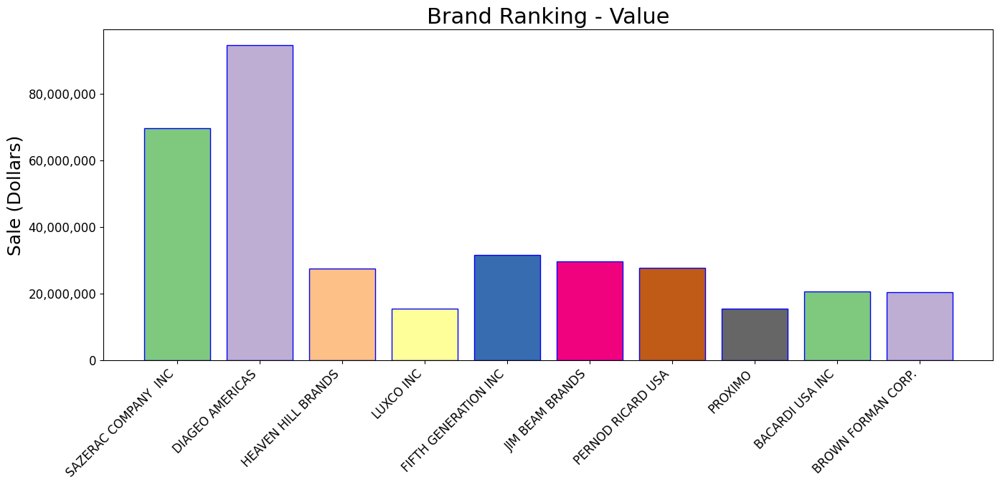

In [34]:

df_rank = df_rank.head(10)
fig, ax = plt.subplots(figsize=(16, 6))
#sns.set(style = 'white')
name = "Accent"
cmap = plt.get_cmap(name)  # type: matplotlib.colors.ListedColormap
colors = cmap.colors  # type: list

plt.title('Brand Ranking - Value', size=22)
ax.bar(df_rank['Vendor Name simple'], df_rank['Sale (Dollars)'], color=colors, edgecolor='blue')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
plt.ylabel('Sale (Dollars)', size=18)
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12)
plt.show()

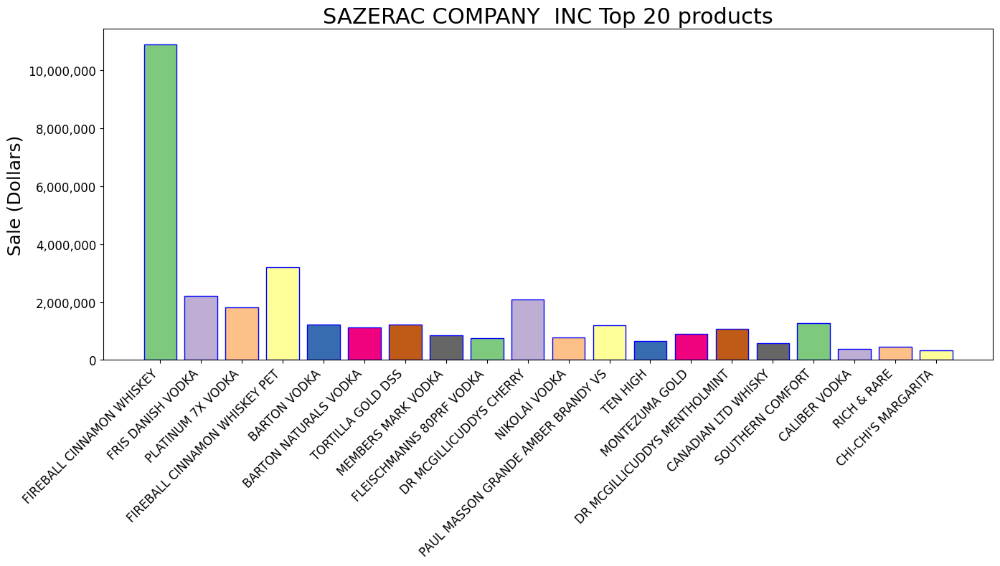

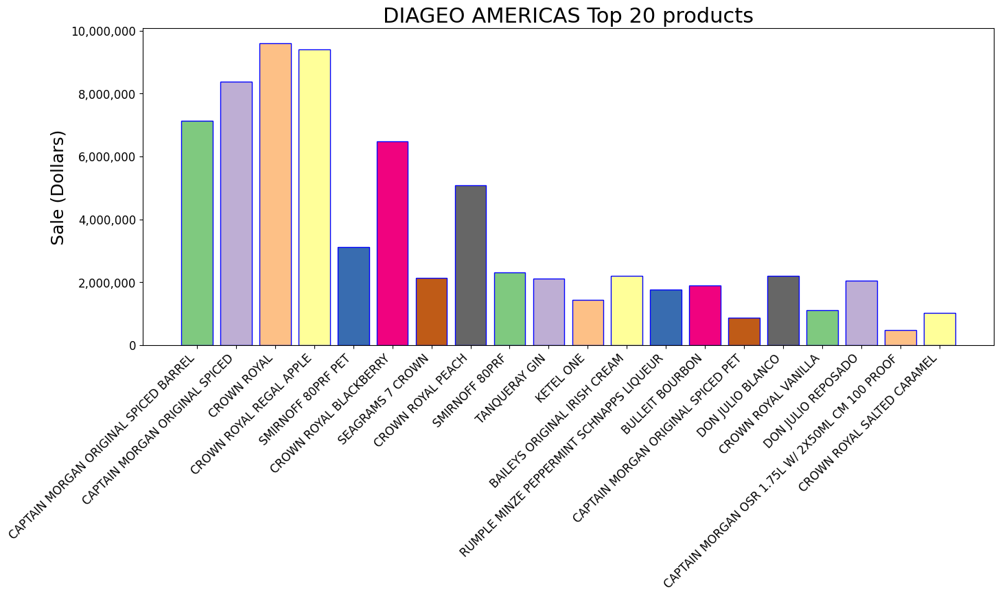

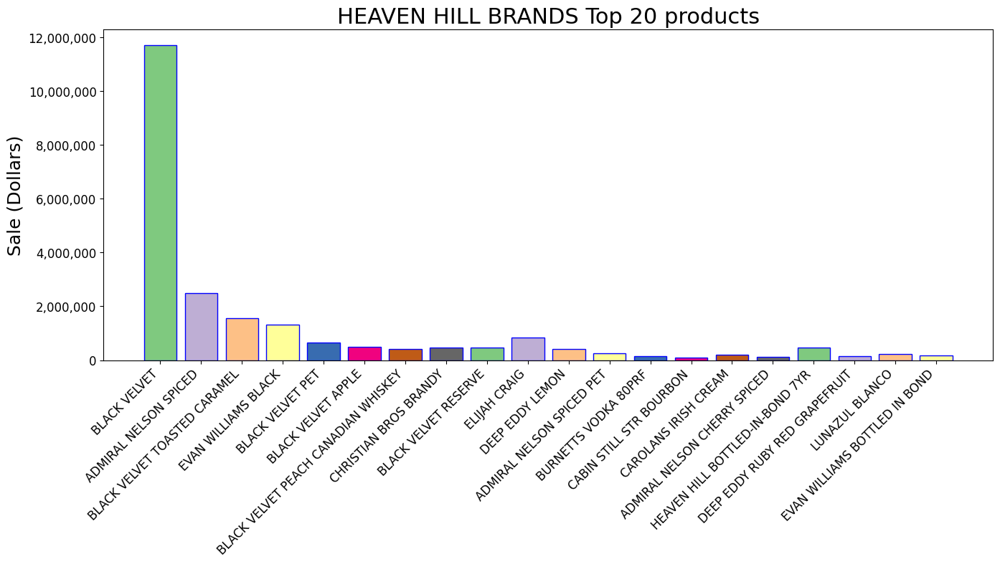

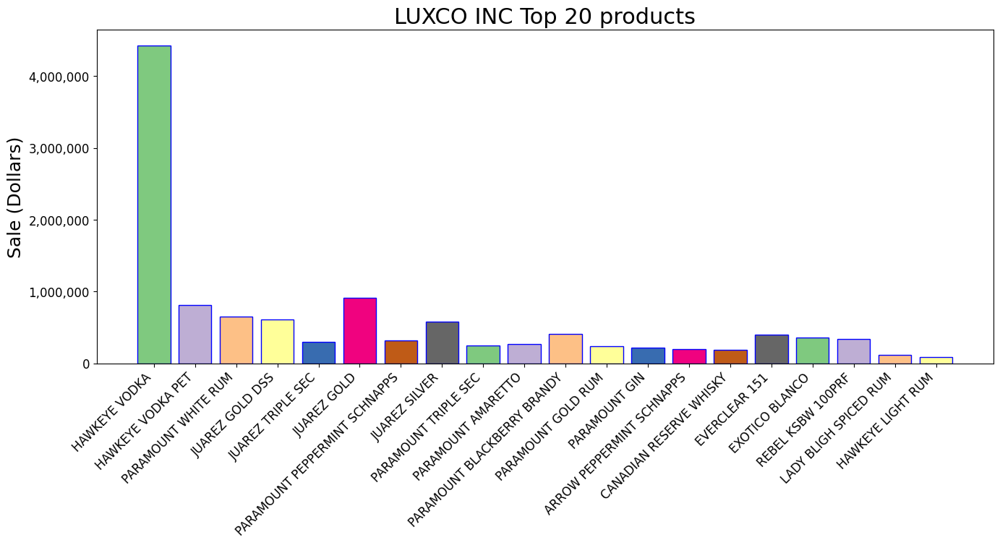

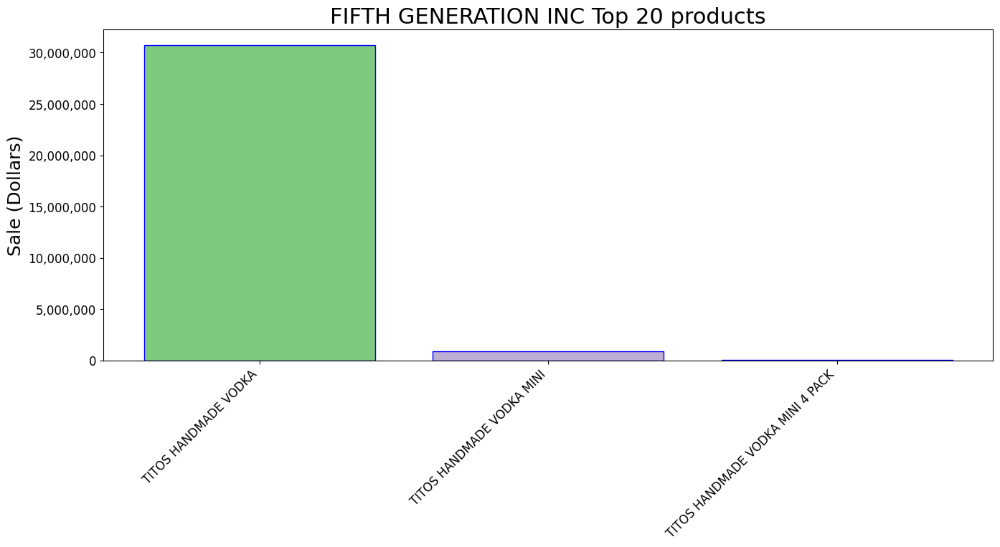

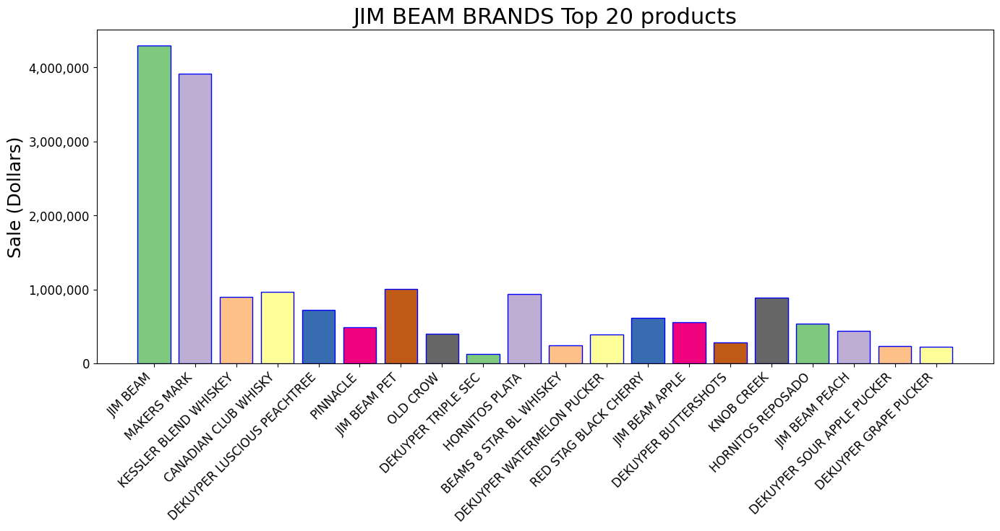

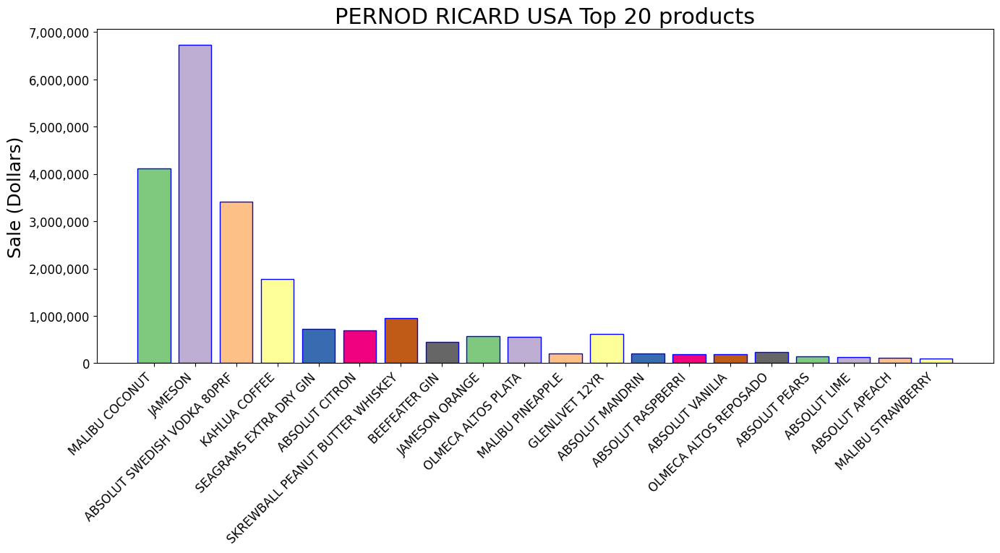

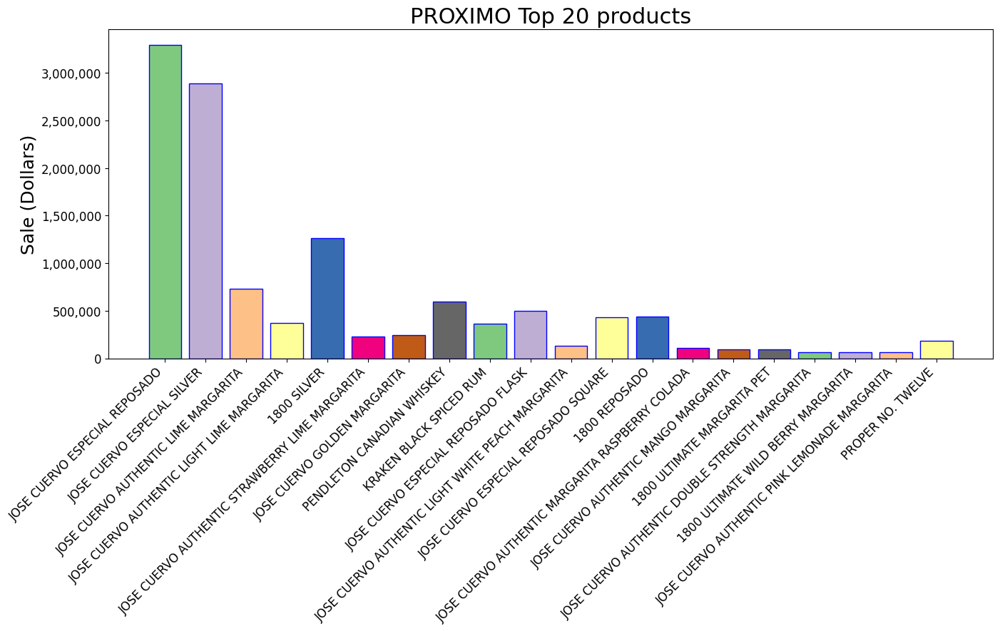

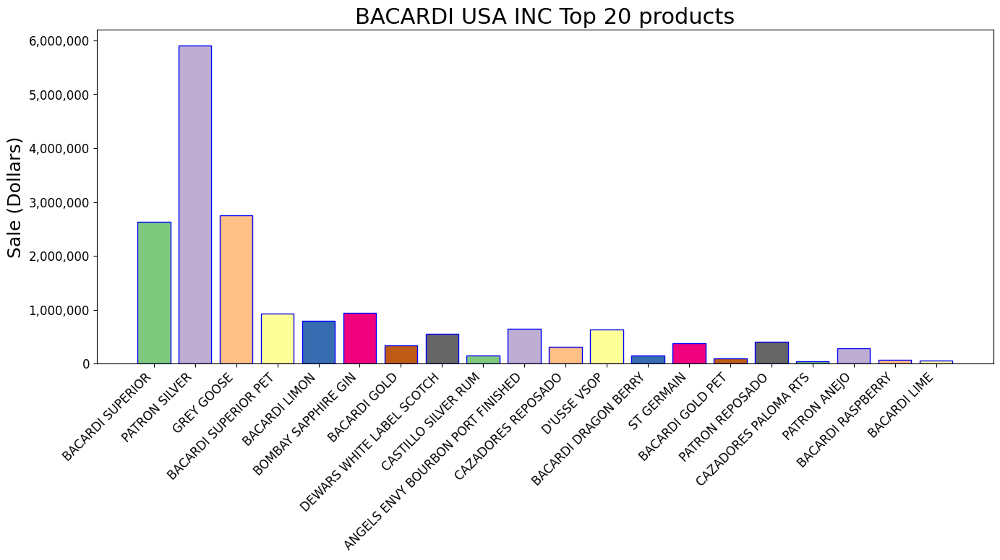

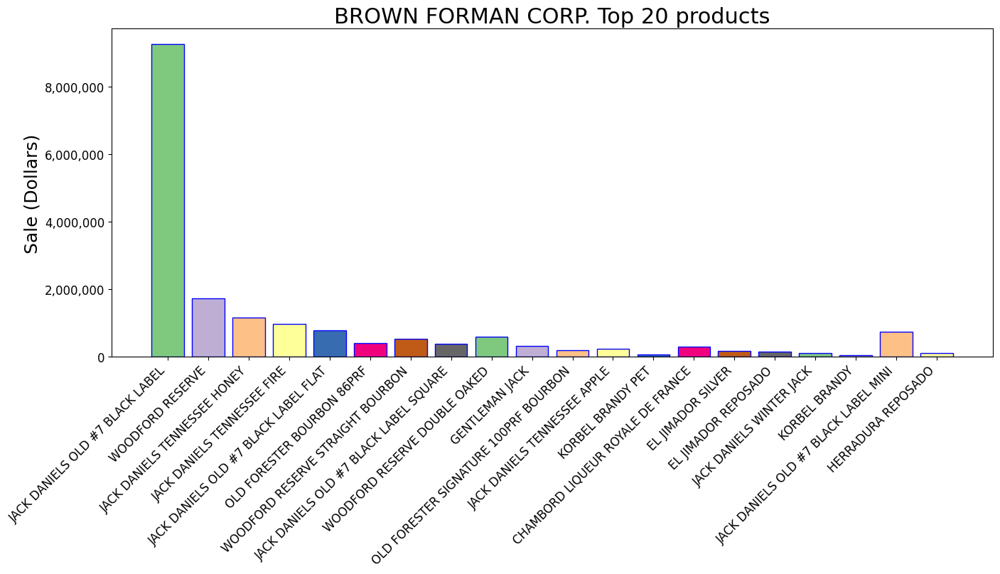

In [35]:
# Item analysis per vendor
main_brands = brands[0:10]

for br in main_brands :
   df_1 = df[df['Vendor Name'] == br]
   df_1 = df_1.groupby(['Item Description'])[['Volume Sold (Liters)','Sale (Dollars)']].sum().reset_index()
   df_1.sort_values(["Volume Sold (Liters)"], ascending=[False], inplace=True)

   df_rank = df_1
   df_rank = df_rank.head(20)
   fig, ax = plt.subplots(figsize=(16, 6))
   #sns.set(style = 'white')
   name = "Accent"
   cmap = plt.get_cmap(name)  # type: matplotlib.colors.ListedColormap
   colors = cmap.colors  # type: list

   plt.title(br +' Top 20 products', size=22)
   ax.bar(df_rank['Item Description'], df_rank['Sale (Dollars)'], color=colors, edgecolor='blue')
   ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
   plt.ylabel('Sale (Dollars)', size=18)
   plt.xticks(fontsize=12, rotation=45, ha='right')
   plt.yticks(fontsize=12)
   plt.show()

In [36]:

df = df_back.copy()


In [37]:
cols_to_drop = ['Date', 'Invoice/Item Number', 'Address', 'City', 'Zip Code',
       'Category',
       'Category Name', 'Vendor Number', 'Vendor Name', 'Item Number',
       'Item Description', 'Pack', 'Bottle Volume (ml)', 'State Bottle Cost',
       'State Bottle Retail', 'Bottles Sold', 'Sale (Dollars)',
       'Volume Sold (Liters)', 'Volume Sold (Gallons)', 'dummy', 'Lat', 'Lon',
       'invoice_number', 'item_number']

In [38]:
df = df.drop(cols_to_drop, axis=1)
df_back1 = df.copy()

In [39]:
# we obtain list of stores and location

stores_df = df.pivot_table(index=['Store Name', "Store Location", "County"])
cols = stores_df.columns
stores_df = stores_df.reset_index()
stores_df = stores_df.drop(cols, axis=1)

In [40]:
# Clean point format
stores_df[['dummy','Lat', 'Lon']]= stores_df['Store Location'].str.split(" ", n=-1, expand=True)
stores_df['Lat'] = stores_df['Lat'].str.replace('(', '')
stores_df['Lon'] = stores_df['Lon'].str.replace(')', '')
stores_df = stores_df.drop('dummy', axis=1)

In [41]:
# A simple folium visualization
# center of IOWA 93.0977 41.8780
i_size = (1,1)
#icon = folium.features.CustomIcon(icon_url,icon_size=isize)
# icons are in fontwawesome.com v4.7
from folium.plugins import BeautifyIcon

map1 = folium.Map(
    location=[41.8780,-93.0977],
    tiles='OpenStreetMap',
    zoom_start=7,
    color='red'
)

# circle marker
circle_green = BeautifyIcon(
    icon_shape='circle-dot', 
    border_color='blue', 
    border_width=3
)
#folium.Marker([-20, 25], tooltip='circle', icon=icon_circle).add_to(m)

stores_df.apply(lambda row:folium.Marker(location=[row["Lon"], row["Lat"]], popup=row['Store Name'],     
              icon=BeautifyIcon(icon_shape='circle-dot', border_color='red',
              fill_opacity=0.4)).add_to(map1), axis=1)
#             icon=folium.Icon(icon='shopping-cart', color='red', prefix='fa'), icon_size=i_size).add_to(map1), axis=1)
map1
#map1.save('test.html')
# what should we do with the 3 outliers?

In [42]:
# Let's do a map of counties 'counting' the shops in that county
# see https://georgetsilva.github.io/posts/mapping-points-with-folium/
# Loading counties geogrpahical information


In [43]:
geo_county=geopandas.read_file('cb_2018_us_county_20m.shp')
# IOWA is state n=19
geo_counties_IOWA = geo_county[geo_county['STATEFP']=='19']

In [44]:
# generate dataframe counting shops per county
df = df_back1.copy()
# first we delete duplicates of shop names in dataframe
df = df.drop_duplicates(subset=['Store Name'], keep='first', inplace=False)
# Now we count the number of stores per county 
df1 = df.groupby(['County Number', 'County'])['Store Name'].count().reset_index()
df1.columns = ['County Number', 'County Name', 'Num Stores']
counties = df1.copy()

In [45]:
geo_counties_IOWA

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
12,19,083,00465230,0500000US19083,19083,Hardin,06,1474505075,1776735,"POLYGON ((-93.49948 42.5577, -93.027 42.55681,..."
47,19,141,00465259,0500000US19141,19141,O'Brien,06,1484154162,447448,"POLYGON ((-95.86191 43.25757, -95.38808 43.255..."
60,19,081,00465229,0500000US19081,19081,Hancock,06,1478895049,5265568,"POLYGON ((-93.97042 43.25536, -93.49764 43.255..."
79,19,019,00465199,0500000US19019,19019,Buchanan,06,1479085972,5223780,"POLYGON ((-92.08166 42.64206, -91.60706 42.643..."
142,19,023,00465201,0500000US19023,19023,Butler,06,1502553961,4191852,"POLYGON ((-93.02514 42.90755, -92.55421 42.907..."
...,...,...,...,...,...,...,...,...,...,...
3014,19,151,00465264,0500000US19151,19151,Pocahontas,06,1495047140,3666530,"POLYGON ((-94.91389 42.9097, -94.44295 42.9080..."
3029,19,161,00465269,0500000US19161,19161,Sac,06,1489300198,8569439,"POLYGON ((-95.38801 42.56174, -94.91448 42.560..."
3042,19,087,00465232,0500000US19087,19087,Henry,06,1124799690,5773350,"POLYGON ((-91.71818 40.90109, -91.71604 41.162..."
3090,19,131,00465254,0500000US19131,19131,Mitchell,06,1215049039,1118415,"POLYGON ((-93.02435 43.49956, -92.87028 43.499..."


In [46]:
geo_counties_IOWA = geo_counties_IOWA.rename(columns={"NAME": "County Name"})
geo_counties_IOWA['County Name'] = geo_counties_IOWA['County Name'].str.upper()
counties = counties.merge(geo_counties_IOWA, on='County Name')
counties = counties.rename(columns={"Store Name": "N stores"})
counties.head(3)



,County Number,County Name,Num Stores,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,LSAD,ALAND,AWATER,geometry
0,1,ADAIR,8,19,001,00465190,0500000US19001,19001,06,1474404193,2597996,"POLYGON ((-94.70063 41.50415, -94.24159 41.503..."
1,2,ADAMS,3,19,003,00465191,0500000US19003,19003,06,1096686268,5367875,"POLYGON ((-94.92759 41.15851, -94.70059 41.158..."
2,3,ALLAMAKEE,11,19,005,00465192,0500000US19005,19005,06,1655115645,51094070,"POLYGON ((-91.61084 43.50069, -91.49104 43.500..."


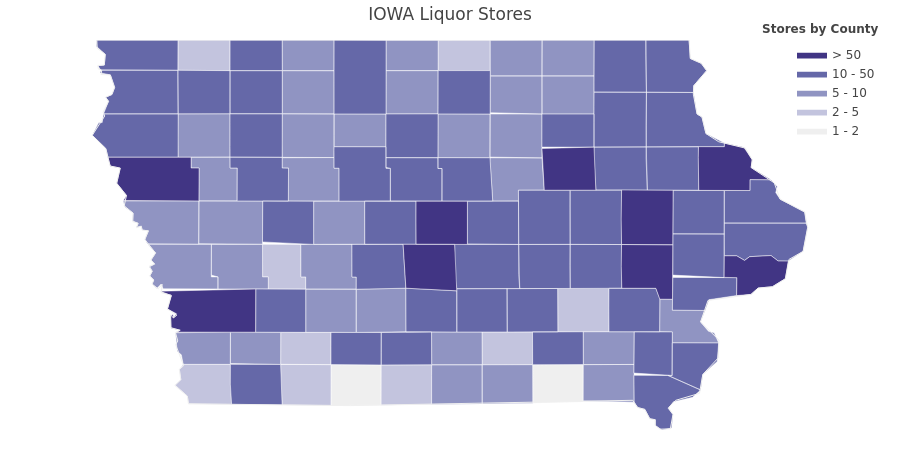

In [47]:
# Let's draw the figure

counties['total_fip'] = counties['STATEFP']+counties['COUNTYFP']
values = counties['Num Stores'].tolist()
fips   = counties['total_fip'].tolist()

colorscale = [
    'rgb(193, 193, 193)',
    'rgb(239,239,239)',
    'rgb(195, 196, 222)',
    'rgb(144,148,194)',
    'rgb(101,104,168)',
    'rgb(65, 53, 132)'
]
fig = ff.create_choropleth(
    fips=fips, values=values, scope=['Iowa'],
    binning_endpoints=[1, 2, 5, 10, 50], colorscale=colorscale,
    county_outline={'color': 'rgb(255,255,255)', 'width': 0.5}, round_legend_values=True,
    legend_title='Stores by County', title='IOWA Liquor Stores'
)
fig.layout.template = None
fig.show('png')

In [52]:
# Figure of county population
file = './data/County_Population_in_Iowa_by_Year.csv'
counties_population = pd.read_csv(file, header=0)
counties_population

,FIPS,County,Year,Population,Primary Point
0,19169,Story County,July 01 2011,91136,POINT (-93.4650448 42.0362415)
1,19065,Fayette County,July 01 1995,22129,POINT (-91.8443207 42.8625919)
2,19089,Howard County,July 01 2002,9794,POINT (-92.3171989 43.3567673)
3,19007,Appanoose County,July 01 1999,13761,POINT (-92.8686104 40.7431635)
4,19043,Clayton County,July 01 2012,17946,POINT (-91.34143280000002 42.8447493)
...,...,...,...,...,...
2965,19101,Jefferson County,July 01 2004,15684,POINT (-91.9488774 41.0317596)
2966,19141,O'Brien County,July 01 2007,14036,POINT (-95.6248784 43.0837527)
2967,19187,Webster County,April 01 2000,40235,POINT (-94.18178810000002 42.4279662)
2968,19097,Jackson County,July 01 2002,20116,POINT (-90.5742294 42.1717426)


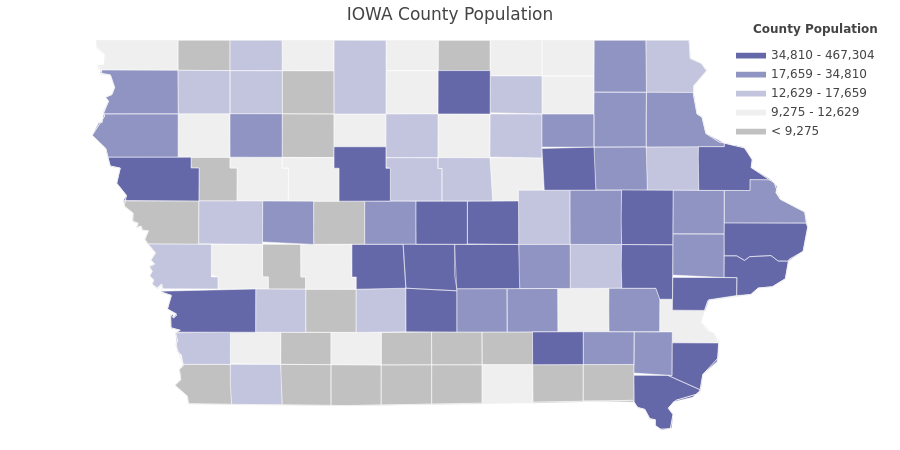

In [53]:
counties_population['Year'] = pd.to_datetime(counties_population['Year'])
counties_population = counties_population[counties_population['Year'].dt.year == 2015]
values = counties_population['Population'].tolist()
fips   = counties_population['FIPS'].tolist()

#Calculating Binning endpoints

quartiles= counties_population['Population'].quantile([0.20,0.4,0.6,0.8,1]).values.tolist()


fig = ff.create_choropleth(
    fips=fips, values=values, scope=['Iowa'],
    binning_endpoints=quartiles, colorscale=colorscale,
    county_outline={'color': 'rgb(255,255,255)', 'width': 0.5}, round_legend_values=True,
    legend_title='County Population', title='IOWA County Population'
)
fig.layout.template = None
fig.show('png')

In [55]:
# Figure City Population IOWA
file = './data/Total_City_Population_by_Year.csv'
cities_population = pd.read_csv(file, header=0)
cities_population['Year'] = pd.to_datetime(cities_population['Year'])
cities_population = cities_population[cities_population['Year'].dt.year == 2015]

In [56]:
# add lat lon cleaning POINT format
cities_population[['dummy','Lon', 'Lat']]= cities_population['Primary Point'].str.split(" ", n=-1, expand=True)
cities_population['Lon'] = cities_population['Lon'].str.replace('(', '')
cities_population['Lat'] = cities_population['Lat'].str.replace(')', '')
cities_population = cities_population.drop('dummy', axis=1)
cities_population = cities_population.sort_values(by='Population', ascending=True)

In [57]:
cities_population['text'] = cities_population['City'] + '<br>Population ' + \
                      (cities_population['Population']).astype(int).astype(str)
limits = [(0,200),(201,400),(501,600),(601,800),(801,943)]
colors = ["crimson","lightseagreen","orange","lightgrey","royalblue"]
cities = []
scale = 50

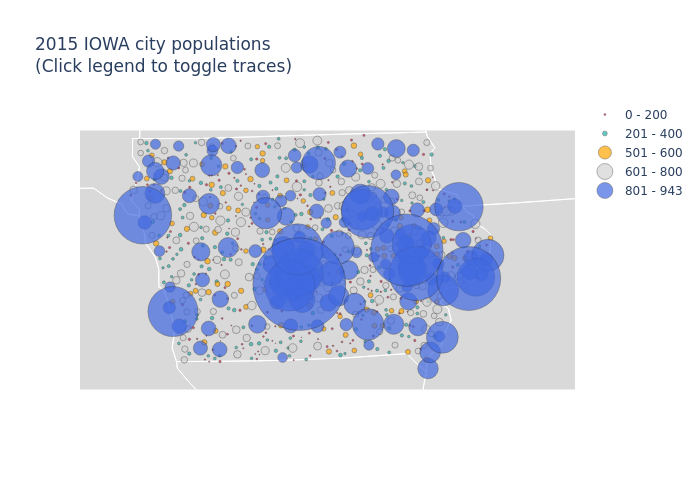

In [58]:
fig = go.Figure()


for i in range(len(limits)):
    lim = limits[i]
    df_sub = cities_population[lim[0]:lim[1]]
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = df_sub['Lon'],
        lat = df_sub['Lat'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['Population']/scale,
            
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])))

fig.update_layout(
        title_text = '2015 IOWA city populations<br>(Click legend to toggle traces)',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )
# focus point
lat_foc = 41.8780
lon_foc = -93.0977
fig.update_layout(
        geo = dict(
            projection_scale=8, #this is kind of like zoom
            center=dict(lat=lat_foc, lon=lon_foc), # this will center on the point
        ))
fig.show('png')# trick to freeze it in Notebook 

In [60]:
import session_info
session_info.show(html=False)

-----
folium              0.19.4
geopandas           1.0.1
matplotlib          3.9.2
pandas              2.2.3
plotly              5.24.1
session_info        1.0.0
thefuzz             0.22.1
-----
IPython             8.29.0
jupyter_client      8.6.3
jupyter_core        5.7.2
-----
Python 3.12.3 (main, Nov  6 2024, 18:32:19) [GCC 13.2.0]
Linux-5.15.167.4-microsoft-standard-WSL2-x86_64-with-glibc2.39
-----
Session information updated at 2025-01-08 16:26
